In [1]:
import numpy as np
from tqdm import tqdm
import torch
import pickle as pkl
from torch.nn.modules.module import Module
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt
import random
use_cuda = torch.cuda.is_available()
device = torch.device('cuda:6') if use_cuda else torch.device('cpu')
if torch.cuda.is_available() == True:
    torch.cuda.set_device(6)
import wandb

In [2]:

N2_self_rules = [85,90,102,153,165,150,195,204,240]
rules = [38,45,54,62,82,84,86]
rules.extend(N2_self_rules)
loss_F = torch.nn.NLLLoss()
NEAR_0 = 1e-10

In [23]:
rule = 85#153#90#85#rules[0]

with open(f'../../../data/CA/CA_data_{rule}.pkl','rb') as f:
    data = pkl.load(f)['histories']
histories = torch.tensor(data,dtype=torch.float)

valid_ratio = 0.2
batch_size = 64
space  = data.shape[-1]
group_size = 3
data = histories#[:,::group_size,:]

In [24]:
histories.shape,data.shape

(torch.Size([100, 180, 120]), torch.Size([100, 180, 120]))

In [25]:
data_x = data[:,:-group_size,:]#.reshape(-1,histories.shape[-1])
data_y = data[:,group_size:,:]#.reshape(-1,histories.shape[-1])

train_data_x = data_x[:int(0.6*data_x.shape[0]),:,:]
train_data_y = data_y[:int(0.6*data_y.shape[0]),:]
valid_data_x = data_x[int(0.6*data_x.shape[0]):int(0.8*data_x.shape[0]),:,:]
valid_data_y = data_y[int(0.6*data_y.shape[0]):int(0.8*data_x.shape[0]),:,:]
test_data_x = data_x[int(0.8*data_x.shape[0]):,:,:]
test_data_y = data_y[int(0.8*data_y.shape[0]):,:,:]

dataset1 = torch.utils.data.dataset.TensorDataset(train_data_x, train_data_y)
dataset2 = torch.utils.data.dataset.TensorDataset(valid_data_x, valid_data_y)
dataset3 = torch.utils.data.dataset.TensorDataset(test_data_x, test_data_y)

train_loader = torch.utils.data.DataLoader(dataset=dataset1,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)

valid_loader = torch.utils.data.DataLoader(dataset=dataset2,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)
test_loader = torch.utils.data.DataLoader(dataset=dataset3,
                                           batch_size=batch_size, 
                                           shuffle=False,
                                           drop_last=False)

In [26]:
train_data_x.shape, train_data_y.shape,valid_data_x.shape

(torch.Size([60, 177, 120]),
 torch.Size([60, 177, 120]),
 torch.Size([20, 177, 120]))

In [27]:
len(train_loader),len(train_loader)

(1, 1)

In [28]:

class DynamicLearner(nn.Module):
    def __init__(self,channel=3,hidden_dim=8):
        super(DynamicLearner, self).__init__()
        hidden_dim = hidden_dim
        self.dynamic_learner1 = nn.Sequential(
            nn.Conv1d(1, channel, 3, padding=1, padding_mode='circular'),
            nn.ReLU(),
        )
        self.dynamic_learner2 = nn.Sequential(
            nn.Linear(channel,2),
            nn.ReLU()
        )
    def forward(self, x):
        x = self.dynamic_learner1(x.unsqueeze(1))
        x = torch.transpose(x,2,1)
        x = self.dynamic_learner2(x)
        x = F.softmax(x,dim=2)
        return x


# 粗粒化过程
class RenormNet(nn.Module):
    def __init__(self,node_size,group_size):
        super(RenormNet, self).__init__()
        channel=3
        self.encoder = nn.Sequential(
            nn.Conv2d(1, channel, group_size, stride=group_size),
            nn.LeakyReLU(),
        )
        self.network1 = nn.Sequential(
            nn.Linear(channel, 2),
            nn.LeakyReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(1, channel, group_size, stride=group_size),
            nn.LeakyReLU(),
        )
        self.network2 = nn.Sequential(
            nn.Linear(channel,2),
            nn.LeakyReLU(),

        )
        
    def forward(self, x):
        return x
    
    def Encoder(self,x):
        encoder = self.encoder(x.unsqueeze(1))#.squeeze(0)
        encoder = encoder.permute(0,2,3,1)
        encoder = self.network1(encoder)#.squeeze(2)
        encoder = F.softmax(encoder,dim=-1)
        return encoder
    
    def Decoder(self,x):
        x = self.decoder(x.unsqueeze(1))
        x = x.permute(0,2,3,1)
        x = self.network2(x)#.squeeze()
        decoder = F.gumbel_softmax(x,dim=-1,hard=True)
        return decoder
    
def init_weight(layer):
    if type(layer)==nn.Conv2d or type(layer)==nn.ConvTranspose2d or type(layer) == nn.Linear:
        nn.init.uniform_(layer.weight, a=0.0, b=1)
        
    

In [29]:
dynamic = torch.load(f'./models/{rule}_dynamic.pth',map_location=torch.device('cpu'))

In [60]:
hidden_size = 128
seed = 2053

random.seed(seed)

In [61]:
NEAR_ZERO=1e-10

  0%|                                                                                                                     | 0/10000 [00:00<?, ?it/s]/opt/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


epoch: 0/10000,train loss:11.51085,valid_loss:11.50560760


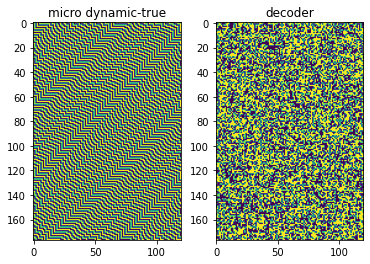

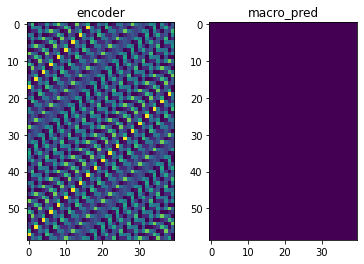

  0%|                                                                                                           | 1/10000 [00:00<2:14:03,  1.24it/s]

tensor([[0.4992, 0.4995],
        [0.4991, 0.4994]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [0., 0., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  0%|▏                                                                                                           | 20/10000 [00:05<44:30,  3.74it/s]

epoch: 20/10000,train loss:11.51278,valid_loss:11.49465847


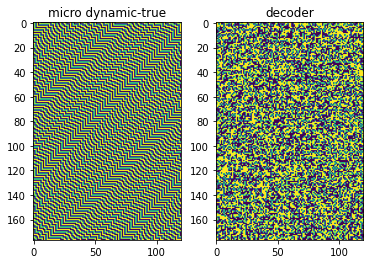

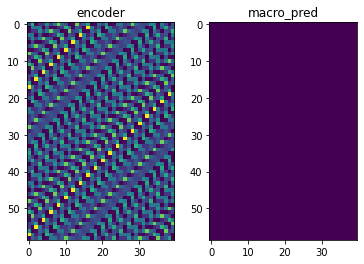

  0%|▏                                                                                                           | 21/10000 [00:06<58:46,  2.83it/s]

tensor([[0.4992, 0.4994],
        [0.4991, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  0%|▍                                                                                                           | 40/10000 [00:11<47:50,  3.47it/s]

epoch: 40/10000,train loss:11.50344,valid_loss:11.50197506


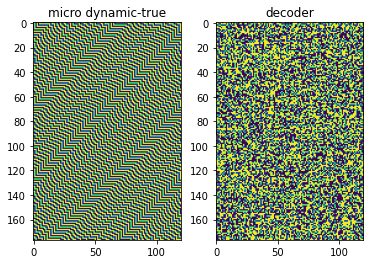

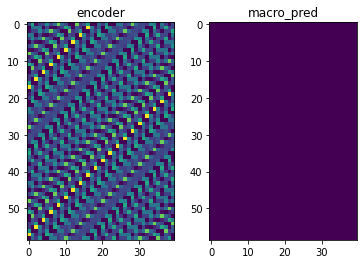

  0%|▍                                                                                                         | 41/10000 [00:11<1:02:50,  2.64it/s]

tensor([[0.4992, 0.4993],
        [0.4991, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  1%|▋                                                                                                           | 60/10000 [00:17<50:28,  3.28it/s]

epoch: 60/10000,train loss:11.53835,valid_loss:11.54902458


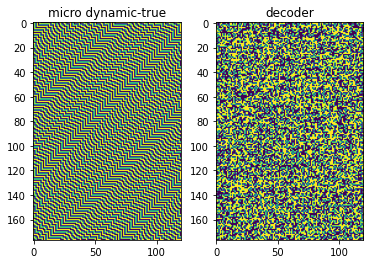

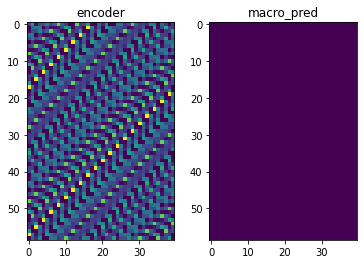

  1%|▋                                                                                                         | 61/10000 [00:18<1:08:06,  2.43it/s]

tensor([[0.4992, 0.4993],
        [0.4991, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [1., 0., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  1%|▊                                                                                                           | 80/10000 [00:24<47:44,  3.46it/s]

epoch: 80/10000,train loss:11.50955,valid_loss:11.51612282


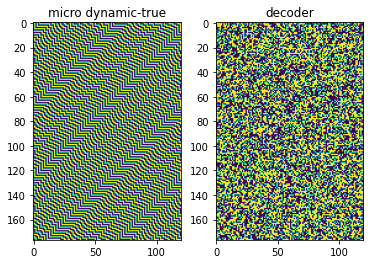

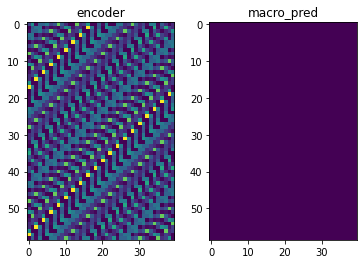

  1%|▊                                                                                                         | 81/10000 [00:24<1:03:03,  2.62it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  1%|█                                                                                                          | 100/10000 [00:30<49:53,  3.31it/s]

epoch: 100/10000,train loss:11.51426,valid_loss:11.50918388


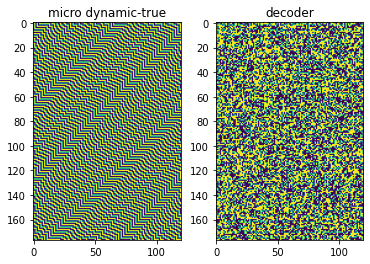

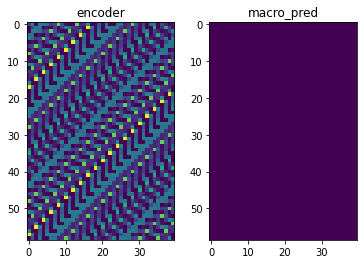

  1%|█                                                                                                        | 101/10000 [00:31<1:01:38,  2.68it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [1., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  1%|█▎                                                                                                         | 120/10000 [00:36<47:27,  3.47it/s]

epoch: 120/10000,train loss:11.50884,valid_loss:11.50999641


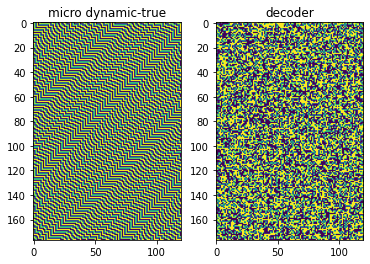

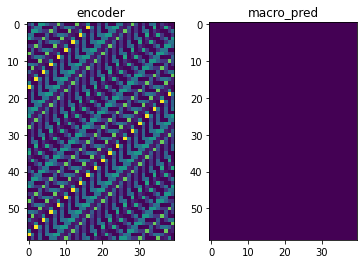

  1%|█▎                                                                                                       | 121/10000 [00:37<1:02:11,  2.65it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [0., 0., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  1%|█▍                                                                                                         | 140/10000 [00:42<47:45,  3.44it/s]

epoch: 140/10000,train loss:11.51891,valid_loss:11.52923965


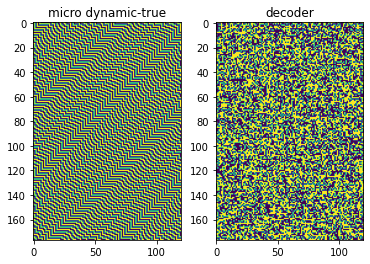

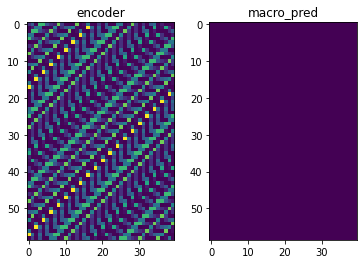

  1%|█▍                                                                                                       | 141/10000 [00:43<1:01:22,  2.68it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [0., 0., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  2%|█▋                                                                                                         | 160/10000 [00:49<47:56,  3.42it/s]

epoch: 160/10000,train loss:11.49889,valid_loss:11.51227379


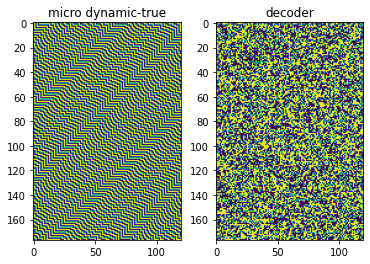

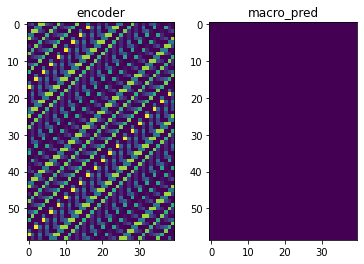

  2%|█▋                                                                                                       | 161/10000 [00:49<1:01:47,  2.65it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [0., 0., 1.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  2%|█▉                                                                                                         | 180/10000 [00:55<48:17,  3.39it/s]

epoch: 180/10000,train loss:11.51352,valid_loss:11.54783344


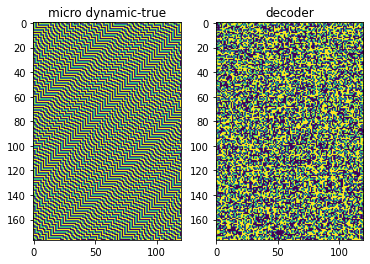

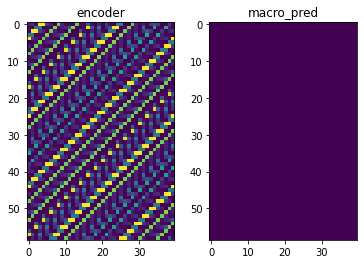

  2%|█▉                                                                                                       | 181/10000 [00:55<1:05:37,  2.49it/s]

tensor([[0.4992, 0.4992],
        [0.4992, 0.4992]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [0., 0., 1.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  2%|██▏                                                                                                        | 200/10000 [01:01<48:03,  3.40it/s]

epoch: 200/10000,train loss:11.49983,valid_loss:11.53189659


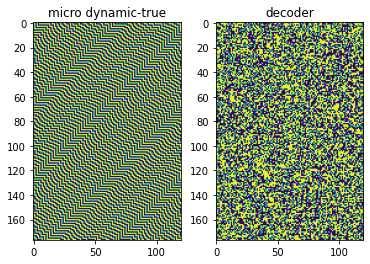

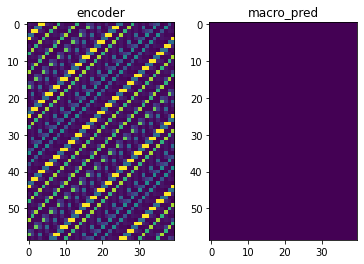

  2%|██                                                                                                       | 201/10000 [01:02<1:01:29,  2.66it/s]

tensor([[0.4993, 0.4993],
        [0.4993, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [1., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  2%|██▎                                                                                                        | 220/10000 [01:07<47:14,  3.45it/s]

epoch: 220/10000,train loss:11.52035,valid_loss:11.53834629


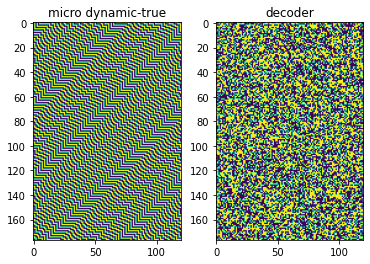

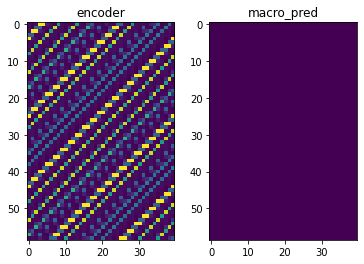

  2%|██▎                                                                                                      | 221/10000 [01:08<1:01:13,  2.66it/s]

tensor([[0.4993, 0.4993],
        [0.4993, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [1., 0., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  2%|██▌                                                                                                        | 240/10000 [01:13<47:21,  3.43it/s]

epoch: 240/10000,train loss:11.50579,valid_loss:11.51482201


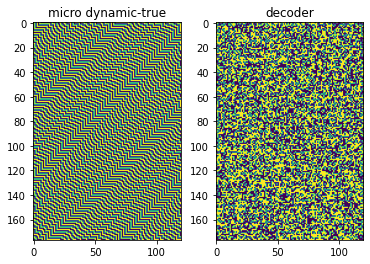

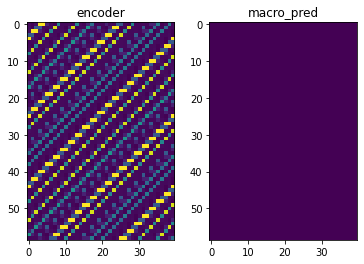

  2%|██▌                                                                                                      | 241/10000 [01:14<1:00:41,  2.68it/s]

tensor([[0.4993, 0.4993],
        [0.4993, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  3%|██▊                                                                                                        | 260/10000 [01:20<54:11,  3.00it/s]

epoch: 260/10000,train loss:11.50499,valid_loss:11.47276020


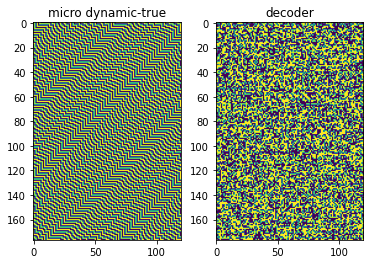

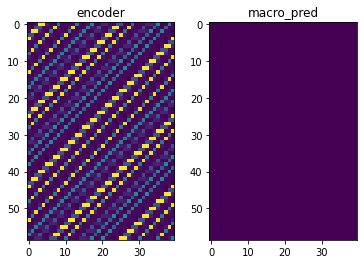

  3%|██▋                                                                                                      | 261/10000 [01:20<1:08:40,  2.36it/s]

tensor([[0.4993, 0.4993],
        [0.4993, 0.4993]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [1., 0., 1.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  3%|██▉                                                                                                        | 280/10000 [01:26<47:14,  3.43it/s]

epoch: 280/10000,train loss:11.49395,valid_loss:11.54528618


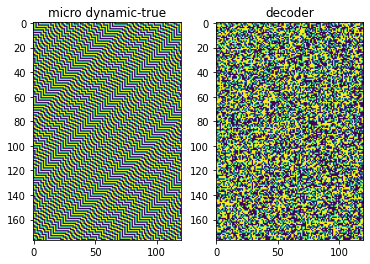

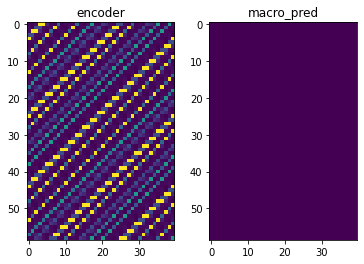

  3%|██▉                                                                                                      | 281/10000 [01:26<1:00:29,  2.68it/s]

tensor([[0.4994, 0.4994],
        [0.4994, 0.4994]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  3%|███▏                                                                                                       | 300/10000 [01:32<51:22,  3.15it/s]

epoch: 300/10000,train loss:11.49722,valid_loss:11.49986267


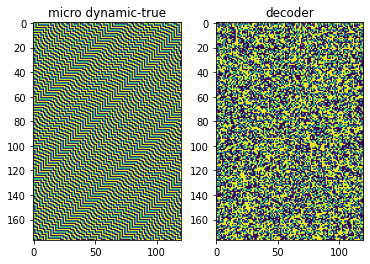

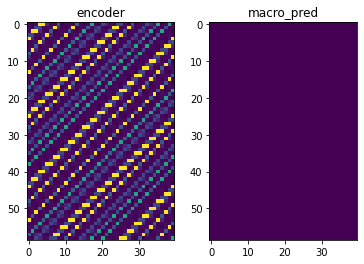

  3%|███▏                                                                                                     | 301/10000 [01:33<1:08:37,  2.36it/s]

tensor([[0.4994, 0.4994],
        [0.4994, 0.4994]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [0., 0., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  3%|███▍                                                                                                       | 320/10000 [01:38<47:02,  3.43it/s]

epoch: 320/10000,train loss:11.50373,valid_loss:11.51362991


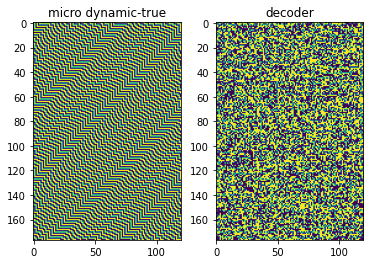

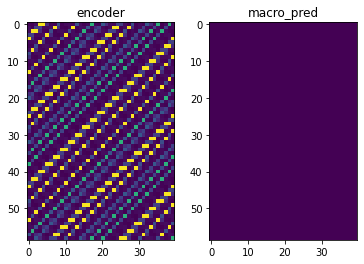

  3%|███▎                                                                                                     | 321/10000 [01:39<1:00:43,  2.66it/s]

tensor([[0.4994, 0.4994],
        [0.4994, 0.4994]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [1., 0., 1.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  3%|███▋                                                                                                       | 340/10000 [01:45<46:46,  3.44it/s]

epoch: 340/10000,train loss:11.51722,valid_loss:11.52408981


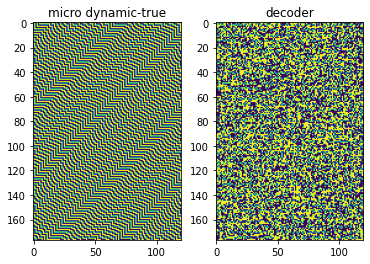

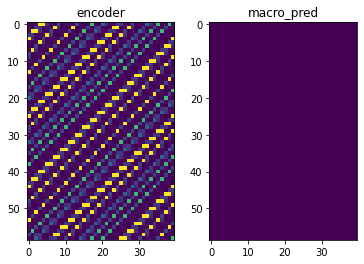

  3%|███▌                                                                                                     | 341/10000 [01:45<1:00:39,  2.65it/s]

tensor([[0.4995, 0.4995],
        [0.4995, 0.4995]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  4%|███▊                                                                                                       | 360/10000 [01:51<47:04,  3.41it/s]

epoch: 360/10000,train loss:11.51677,valid_loss:11.49715137


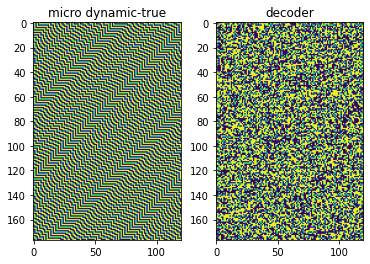

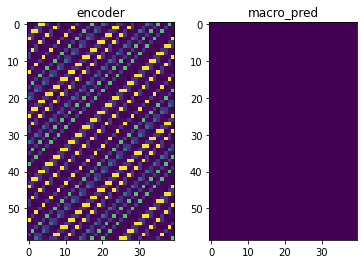

  4%|███▊                                                                                                     | 361/10000 [01:51<1:00:13,  2.67it/s]

tensor([[0.4995, 0.4995],
        [0.4995, 0.4995]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [1., 0., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  4%|████                                                                                                       | 380/10000 [01:57<46:24,  3.45it/s]

epoch: 380/10000,train loss:11.53493,valid_loss:11.53005409


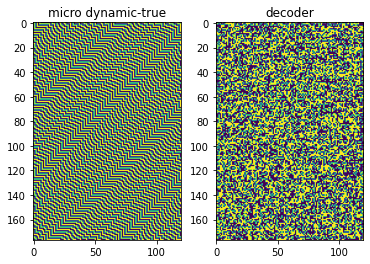

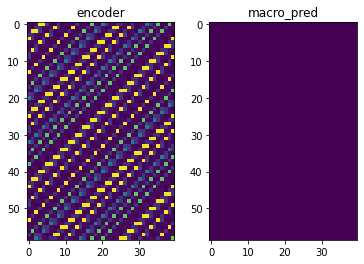

  4%|████                                                                                                     | 381/10000 [01:57<1:00:11,  2.66it/s]

tensor([[0.4995, 0.4995],
        [0.4995, 0.4995]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 1., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  4%|████▎                                                                                                      | 400/10000 [02:03<46:50,  3.42it/s]

epoch: 400/10000,train loss:11.50895,valid_loss:11.51411629


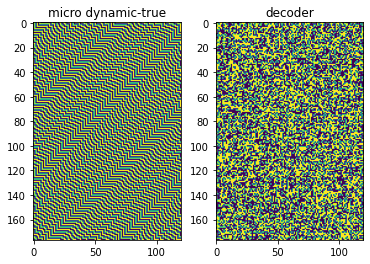

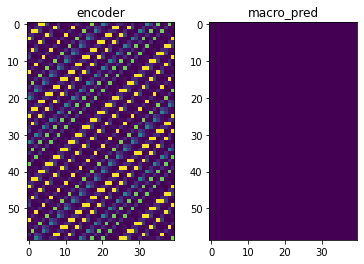

  4%|████▏                                                                                                    | 401/10000 [02:04<1:00:33,  2.64it/s]

tensor([[0.4996, 0.4996],
        [0.4996, 0.4996]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 1., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  4%|████▍                                                                                                      | 420/10000 [02:09<46:31,  3.43it/s]

epoch: 420/10000,train loss:11.50451,valid_loss:11.52766800


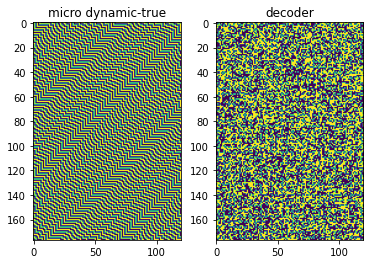

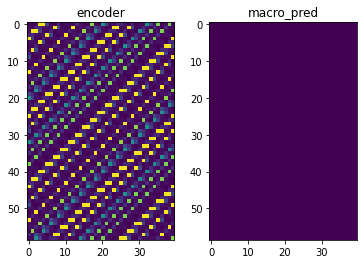

  4%|████▌                                                                                                      | 421/10000 [02:10<59:54,  2.66it/s]

tensor([[0.4996, 0.4996],
        [0.4996, 0.4996]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  4%|████▋                                                                                                      | 440/10000 [02:15<46:13,  3.45it/s]

epoch: 440/10000,train loss:11.50384,valid_loss:11.48116016


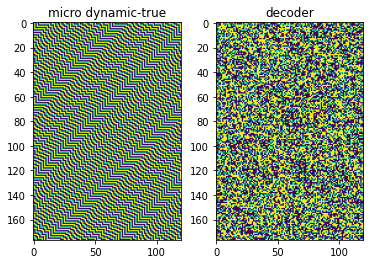

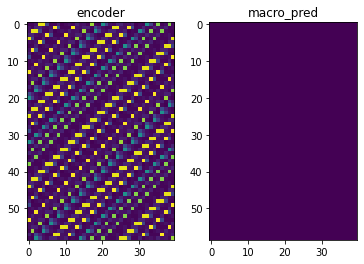

  4%|████▋                                                                                                    | 441/10000 [02:16<1:00:13,  2.65it/s]

tensor([[0.4996, 0.4996],
        [0.4996, 0.4996]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [1., 0., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


  5%|████▉                                                                                                      | 460/10000 [02:22<49:01,  3.24it/s]

epoch: 460/10000,train loss:11.50940,valid_loss:11.54512215


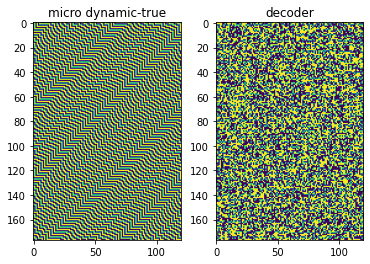

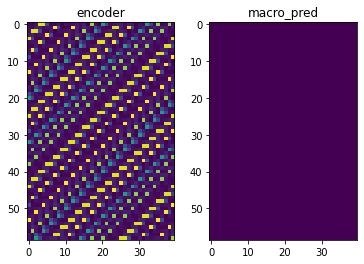

  5%|████▊                                                                                                    | 461/10000 [02:23<1:02:45,  2.53it/s]

tensor([[0.4996, 0.4996],
        [0.4996, 0.4996]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 1.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  5%|█████▏                                                                                                     | 480/10000 [02:28<46:34,  3.41it/s]

epoch: 480/10000,train loss:11.51692,valid_loss:11.49736786


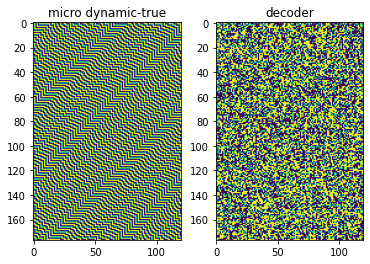

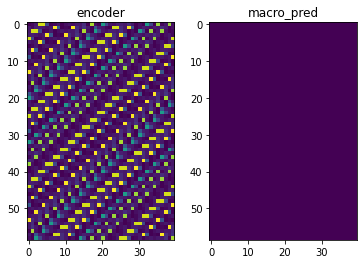

  5%|█████▏                                                                                                     | 481/10000 [02:29<59:45,  2.65it/s]

tensor([[0.4997, 0.4997],
        [0.4997, 0.4997]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 1., 1.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  5%|█████▎                                                                                                     | 500/10000 [02:35<45:59,  3.44it/s]

epoch: 500/10000,train loss:11.51036,valid_loss:11.52159595


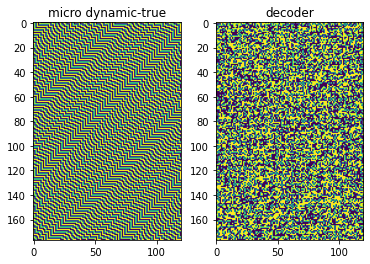

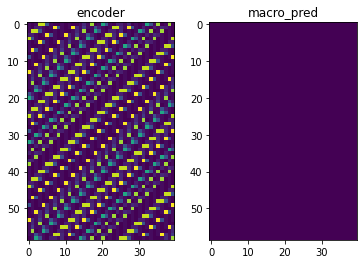

  5%|█████▎                                                                                                     | 501/10000 [02:35<59:50,  2.65it/s]

tensor([[0.4997, 0.4997],
        [0.4997, 0.4997]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  5%|█████▌                                                                                                     | 520/10000 [02:41<45:55,  3.44it/s]

epoch: 520/10000,train loss:11.49909,valid_loss:11.49135208


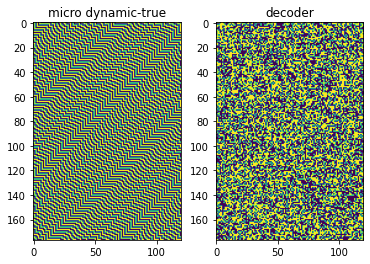

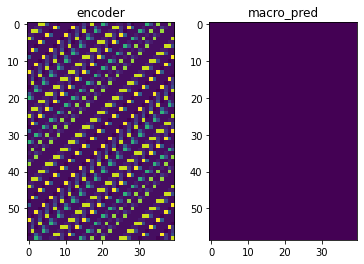

  5%|█████▌                                                                                                     | 521/10000 [02:41<59:06,  2.67it/s]

tensor([[0.4997, 0.4997],
        [0.4997, 0.4997]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [0., 0., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  5%|█████▊                                                                                                     | 540/10000 [02:47<46:04,  3.42it/s]

epoch: 540/10000,train loss:11.52041,valid_loss:11.49720573


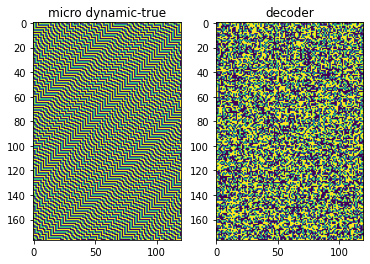

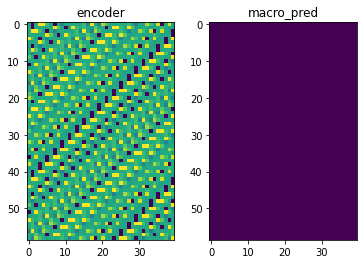

  5%|█████▊                                                                                                     | 541/10000 [02:47<59:04,  2.67it/s]

tensor([[0.4997, 0.4997],
        [0.4997, 0.4997]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [0., 0., 1.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  6%|█████▉                                                                                                     | 560/10000 [02:53<46:07,  3.41it/s]

epoch: 560/10000,train loss:11.52630,valid_loss:11.50755882


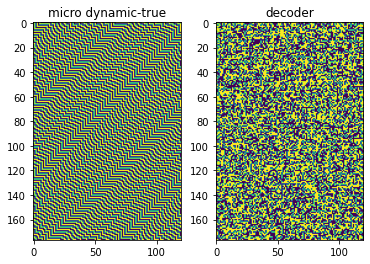

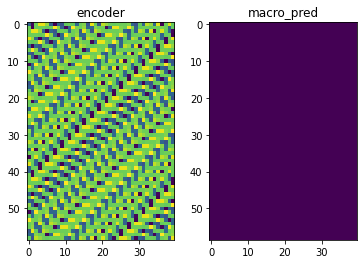

  6%|██████                                                                                                     | 561/10000 [02:53<59:27,  2.65it/s]

tensor([[0.4997, 0.4997],
        [0.4997, 0.4997]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [1., 1., 1.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  6%|██████▏                                                                                                    | 580/10000 [02:59<45:26,  3.46it/s]

epoch: 580/10000,train loss:11.50658,valid_loss:11.50755882


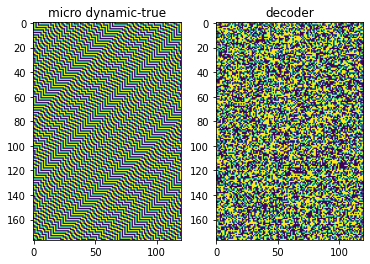

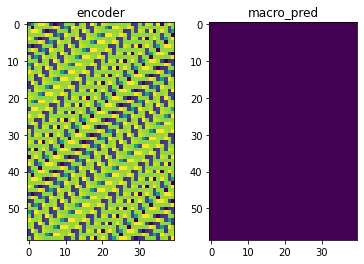

  6%|██████▏                                                                                                    | 581/10000 [03:00<58:10,  2.70it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [1., 1., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  6%|██████▍                                                                                                    | 600/10000 [03:05<45:19,  3.46it/s]

epoch: 600/10000,train loss:11.51921,valid_loss:11.54257393


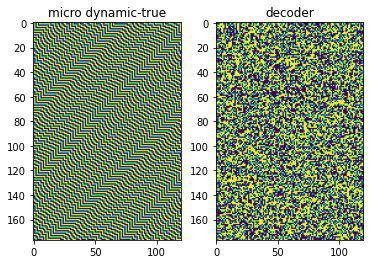

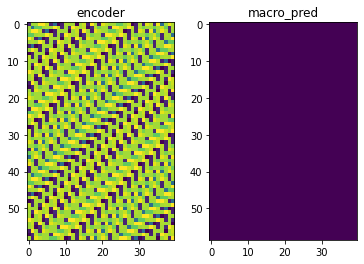

  6%|██████▍                                                                                                    | 601/10000 [03:06<59:02,  2.65it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [0., 0., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  6%|██████▋                                                                                                    | 620/10000 [03:11<45:29,  3.44it/s]

epoch: 620/10000,train loss:11.51399,valid_loss:11.52658558


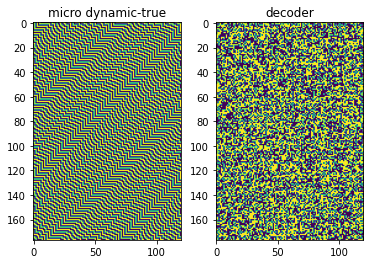

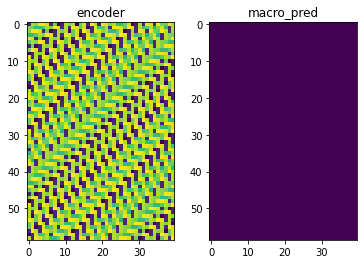

  6%|██████▋                                                                                                    | 621/10000 [03:12<58:17,  2.68it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  6%|██████▊                                                                                                    | 640/10000 [03:18<45:56,  3.40it/s]

epoch: 640/10000,train loss:11.51531,valid_loss:11.51861572


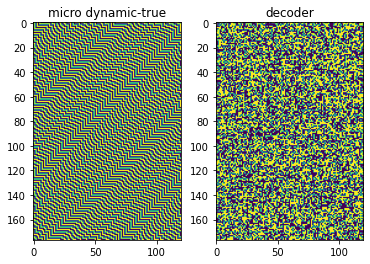

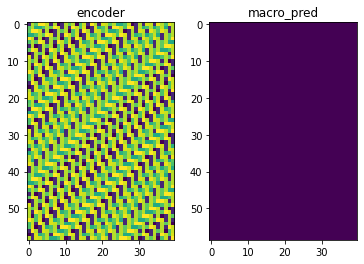

  6%|██████▊                                                                                                    | 641/10000 [03:18<58:19,  2.67it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [1., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


  7%|███████                                                                                                    | 660/10000 [03:24<45:38,  3.41it/s]

epoch: 660/10000,train loss:11.51833,valid_loss:11.50820827


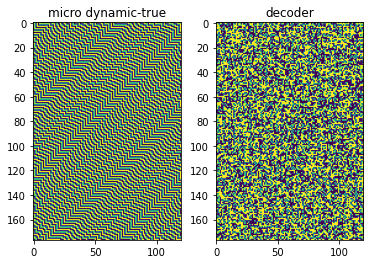

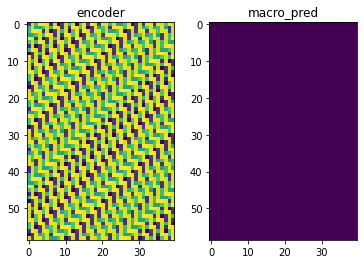

  7%|███████                                                                                                    | 661/10000 [03:25<59:05,  2.63it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [1., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  7%|███████▎                                                                                                   | 680/10000 [03:30<45:04,  3.45it/s]

epoch: 680/10000,train loss:11.49224,valid_loss:11.50723362


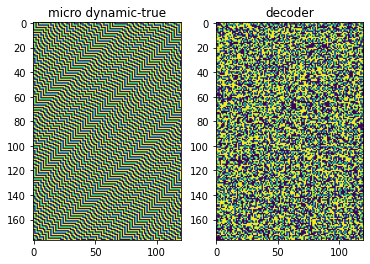

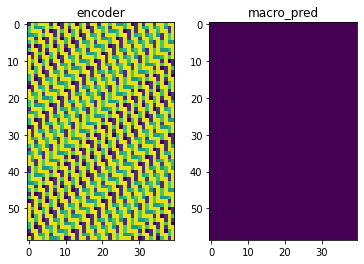

  7%|███████▎                                                                                                   | 681/10000 [03:31<57:42,  2.69it/s]

tensor([[0.4998, 0.4998],
        [0.4998, 0.4998]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [1., 0., 0.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


  7%|███████▍                                                                                                   | 700/10000 [03:37<45:18,  3.42it/s]

epoch: 700/10000,train loss:11.51061,valid_loss:11.50566196


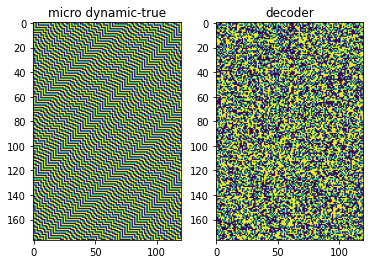

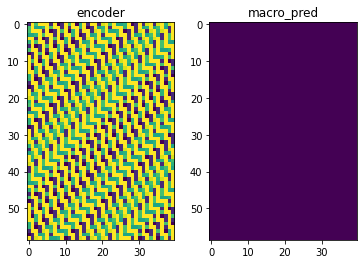

  7%|███████▌                                                                                                   | 701/10000 [03:37<58:57,  2.63it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  7%|███████▋                                                                                                   | 720/10000 [03:43<45:03,  3.43it/s]

epoch: 720/10000,train loss:11.52510,valid_loss:11.52447128


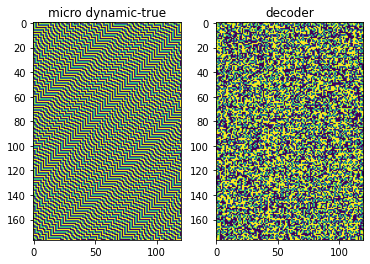

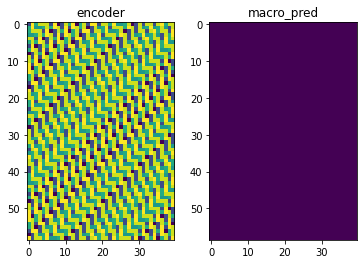

  7%|███████▋                                                                                                   | 721/10000 [03:43<57:35,  2.69it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


  7%|███████▉                                                                                                   | 740/10000 [03:49<45:13,  3.41it/s]

epoch: 740/10000,train loss:11.51775,valid_loss:11.52934837


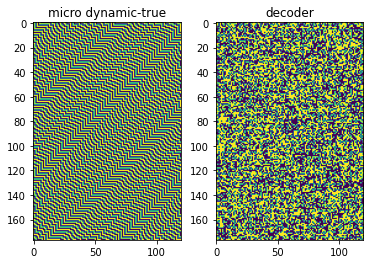

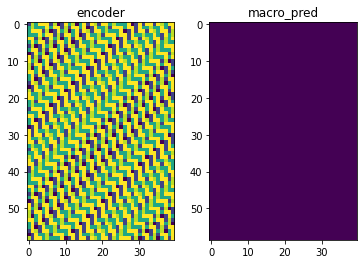

  7%|███████▉                                                                                                   | 741/10000 [03:50<58:15,  2.65it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [1., 1., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  8%|████████▏                                                                                                  | 760/10000 [03:55<45:40,  3.37it/s]

epoch: 760/10000,train loss:11.49587,valid_loss:11.51102734


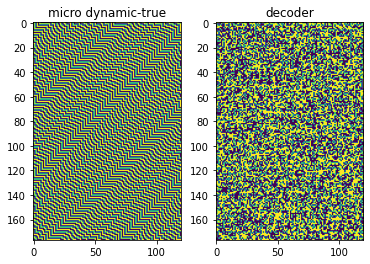

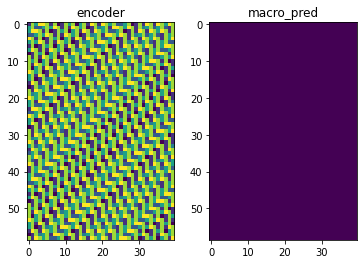

  8%|████████▏                                                                                                  | 761/10000 [03:56<58:02,  2.65it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 0., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


  8%|████████▎                                                                                                  | 780/10000 [04:01<44:55,  3.42it/s]

epoch: 780/10000,train loss:11.50982,valid_loss:11.51032257


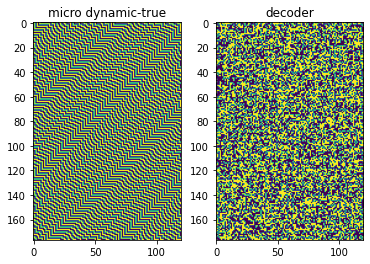

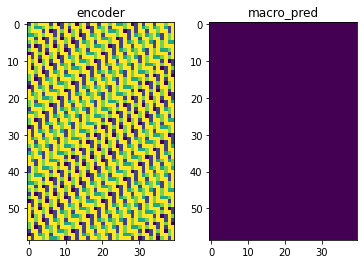

  8%|████████▎                                                                                                  | 781/10000 [04:02<57:52,  2.65it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [0., 0., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  8%|████████▌                                                                                                  | 800/10000 [04:07<44:33,  3.44it/s]

epoch: 800/10000,train loss:11.51159,valid_loss:11.48777390


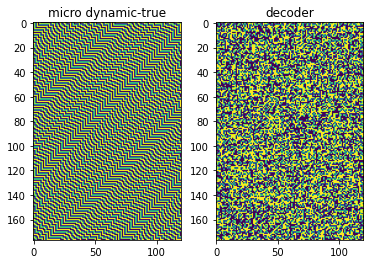

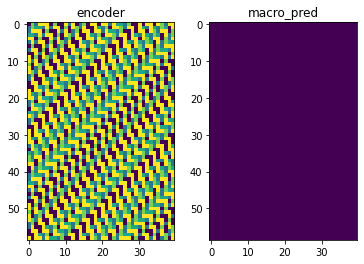

  8%|████████▌                                                                                                  | 801/10000 [04:08<57:30,  2.67it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 0., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  8%|████████▊                                                                                                  | 820/10000 [04:14<44:38,  3.43it/s]

epoch: 820/10000,train loss:11.52924,valid_loss:11.51200294


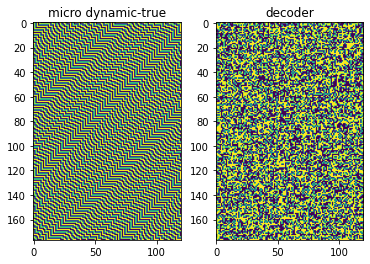

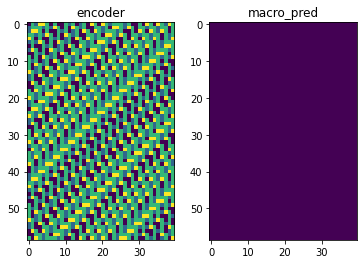

  8%|████████▊                                                                                                  | 821/10000 [04:14<57:03,  2.68it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [0., 1., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  8%|████████▊                                                                                                | 840/10000 [04:20<1:00:19,  2.53it/s]

epoch: 840/10000,train loss:11.52452,valid_loss:11.51194954


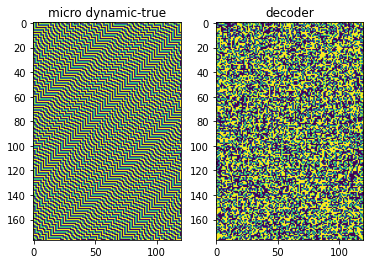

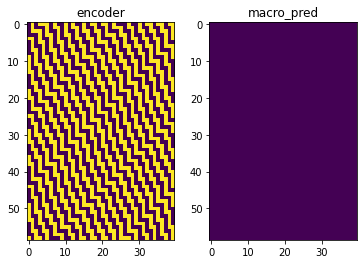

  8%|████████▊                                                                                                | 841/10000 [04:21<1:10:59,  2.15it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [0., 0., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


  9%|█████████▏                                                                                                 | 860/10000 [04:27<45:04,  3.38it/s]

epoch: 860/10000,train loss:11.50539,valid_loss:11.45845127


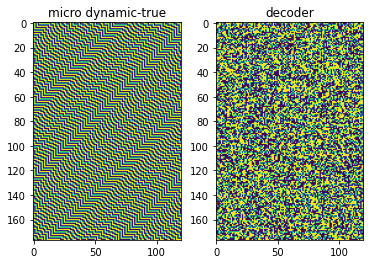

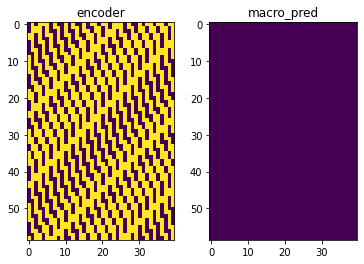

  9%|█████████▏                                                                                                 | 861/10000 [04:27<58:08,  2.62it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [0., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


  9%|█████████▍                                                                                                 | 880/10000 [04:33<44:16,  3.43it/s]

epoch: 880/10000,train loss:11.50745,valid_loss:11.51097488


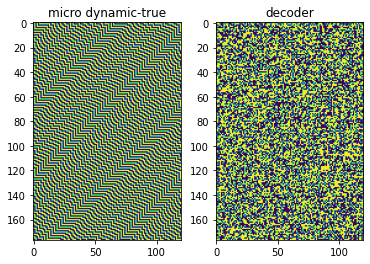

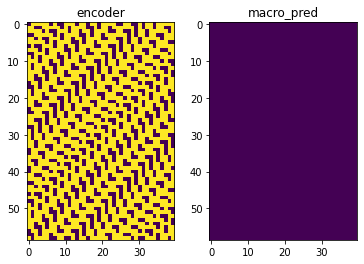

  9%|█████████▍                                                                                                 | 881/10000 [04:33<56:41,  2.68it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  9%|█████████▋                                                                                                 | 900/10000 [04:39<44:23,  3.42it/s]

epoch: 900/10000,train loss:11.52796,valid_loss:11.52674770


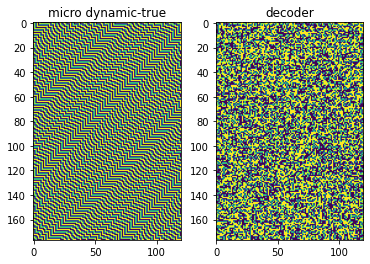

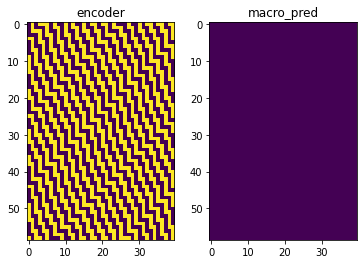

  9%|█████████▋                                                                                                 | 901/10000 [04:39<56:46,  2.67it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [0., 1., 0.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


  9%|█████████▊                                                                                                 | 920/10000 [04:45<43:58,  3.44it/s]

epoch: 920/10000,train loss:11.52487,valid_loss:11.50652981


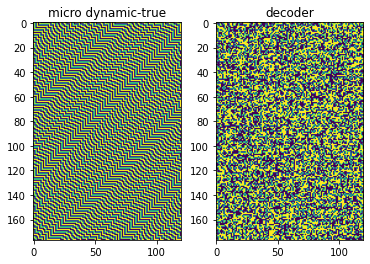

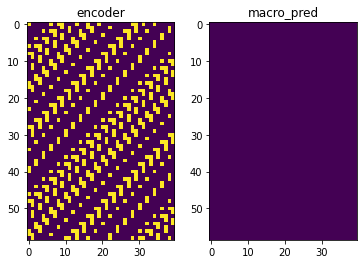

  9%|█████████▊                                                                                                 | 921/10000 [04:46<56:53,  2.66it/s]

tensor([[0.4999, 0.4999],
        [0.4999, 0.4999]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [1., 0., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


  9%|██████████                                                                                                 | 940/10000 [04:51<43:48,  3.45it/s]

epoch: 940/10000,train loss:11.51302,valid_loss:11.50761414


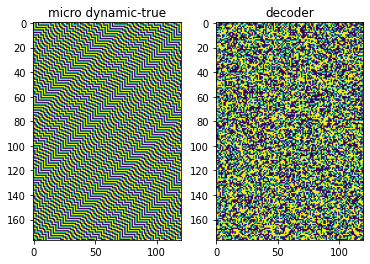

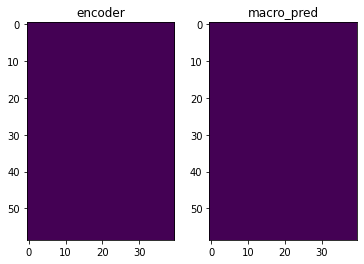

  9%|██████████                                                                                                 | 941/10000 [04:52<56:40,  2.66it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 10%|██████████▎                                                                                                | 960/10000 [04:57<43:46,  3.44it/s]

epoch: 960/10000,train loss:11.50597,valid_loss:11.50983524


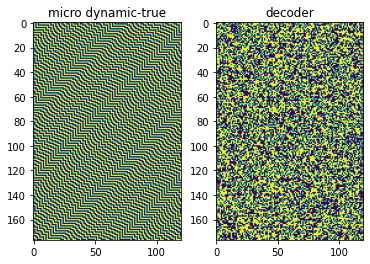

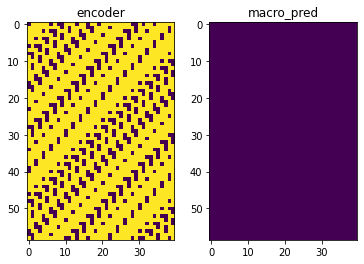

 10%|██████████▎                                                                                                | 961/10000 [04:58<57:25,  2.62it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 10%|██████████▍                                                                                                | 980/10000 [05:03<43:29,  3.46it/s]

epoch: 980/10000,train loss:11.52131,valid_loss:11.54555416


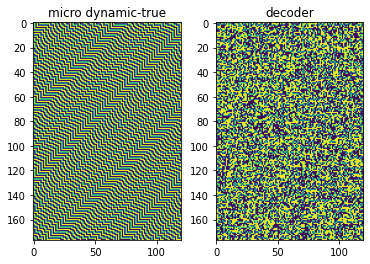

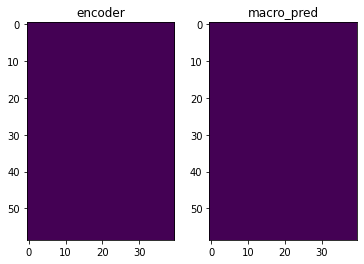

 10%|██████████▍                                                                                                | 981/10000 [05:04<56:21,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [0., 0., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 10%|██████████▌                                                                                               | 1000/10000 [05:10<43:26,  3.45it/s]

epoch: 1000/10000,train loss:11.52406,valid_loss:11.49156857


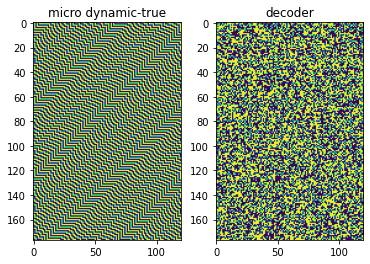

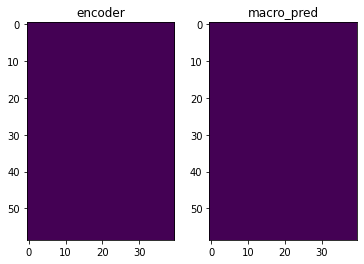

 10%|██████████▌                                                                                               | 1001/10000 [05:10<56:15,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 10%|██████████▊                                                                                               | 1020/10000 [05:16<43:30,  3.44it/s]

epoch: 1020/10000,train loss:11.51350,valid_loss:11.49379158


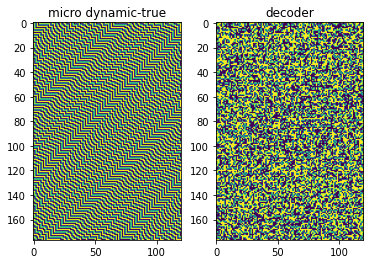

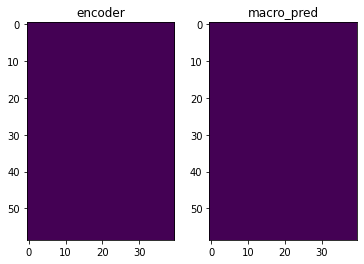

 10%|██████████▊                                                                                               | 1021/10000 [05:16<56:08,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 1.],
        [0., 1., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 10%|███████████                                                                                               | 1040/10000 [05:23<45:37,  3.27it/s]

epoch: 1040/10000,train loss:11.51386,valid_loss:11.53737164


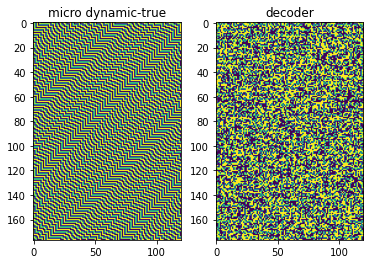

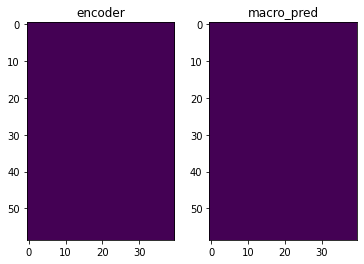

 10%|███████████                                                                                               | 1041/10000 [05:23<58:13,  2.56it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 11%|███████████▏                                                                                              | 1060/10000 [05:29<42:53,  3.47it/s]

epoch: 1060/10000,train loss:11.50693,valid_loss:11.50094604


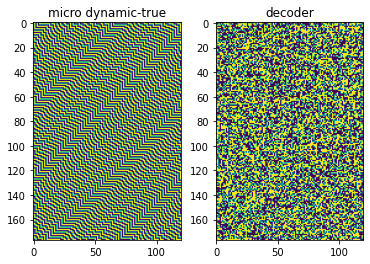

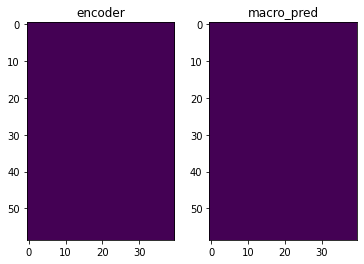

 11%|███████████▏                                                                                              | 1061/10000 [05:29<55:46,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [0., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 11%|███████████▍                                                                                              | 1080/10000 [05:35<43:41,  3.40it/s]

epoch: 1080/10000,train loss:11.51363,valid_loss:11.53065109


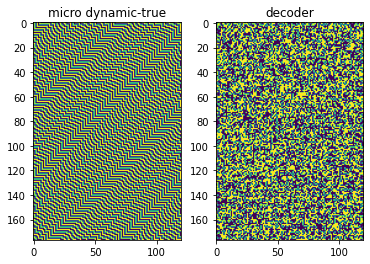

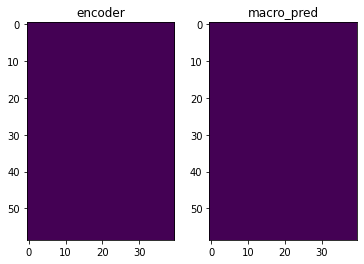

 11%|███████████▍                                                                                              | 1081/10000 [05:36<56:32,  2.63it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [0., 1., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 11%|███████████▋                                                                                              | 1100/10000 [05:41<44:04,  3.37it/s]

epoch: 1100/10000,train loss:11.49677,valid_loss:11.52945709


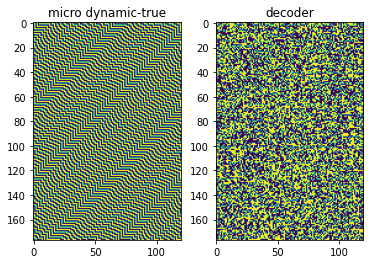

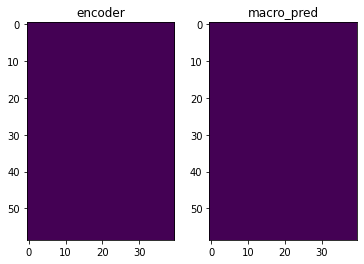

 11%|███████████▋                                                                                              | 1101/10000 [05:42<56:20,  2.63it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


 11%|███████████▊                                                                                              | 1120/10000 [05:48<43:25,  3.41it/s]

epoch: 1120/10000,train loss:11.50877,valid_loss:11.52436161


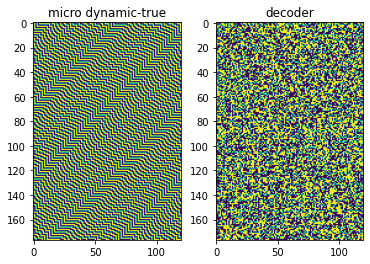

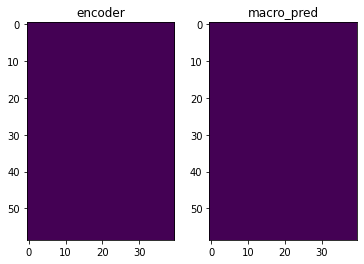

 11%|███████████▉                                                                                              | 1121/10000 [05:48<56:03,  2.64it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [1., 0., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 11%|████████████                                                                                              | 1140/10000 [05:54<43:08,  3.42it/s]

epoch: 1140/10000,train loss:11.48832,valid_loss:11.48067284


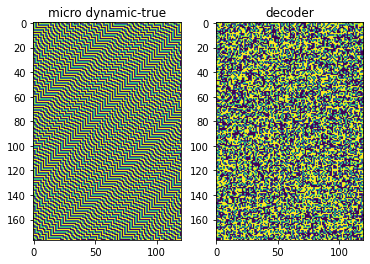

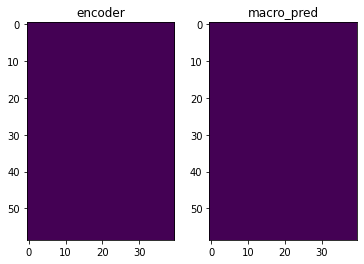

 11%|████████████                                                                                              | 1141/10000 [05:54<55:19,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 1., 1.],
        [0., 0., 1.]], grad_fn=<SelectBackward0>)


 12%|████████████▎                                                                                             | 1160/10000 [06:00<44:59,  3.27it/s]

epoch: 1160/10000,train loss:11.54236,valid_loss:11.49492931


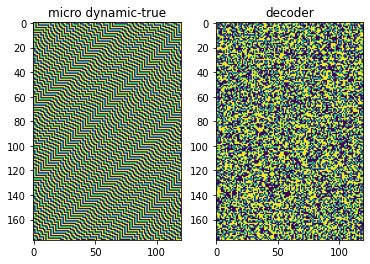

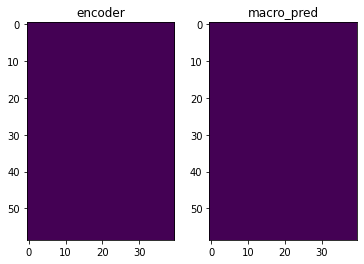

 12%|████████████▎                                                                                             | 1161/10000 [06:01<57:17,  2.57it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 0., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 12%|████████████▌                                                                                             | 1180/10000 [06:06<43:06,  3.41it/s]

epoch: 1180/10000,train loss:11.50879,valid_loss:11.50538921


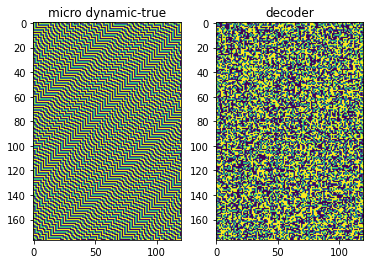

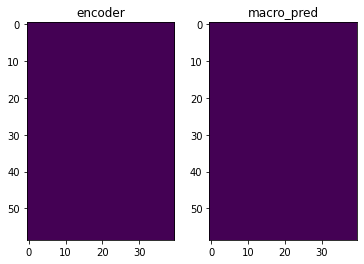

 12%|████████████▌                                                                                             | 1181/10000 [06:07<55:26,  2.65it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 0., 0.],
        [0., 1., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 12%|████████████▋                                                                                             | 1200/10000 [06:12<43:02,  3.41it/s]

epoch: 1200/10000,train loss:11.50402,valid_loss:11.50045872


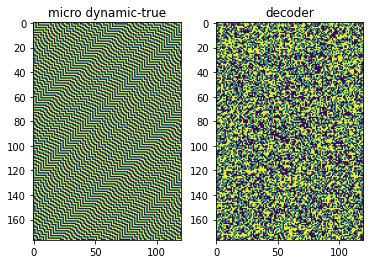

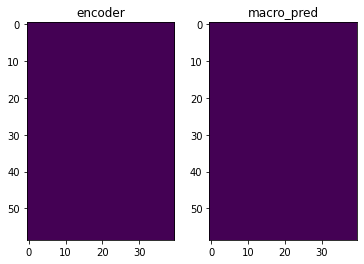

 12%|████████████▋                                                                                             | 1201/10000 [06:13<55:53,  2.62it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 0., 1.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 12%|████████████▉                                                                                             | 1220/10000 [06:19<42:50,  3.42it/s]

epoch: 1220/10000,train loss:11.52234,valid_loss:11.48967171


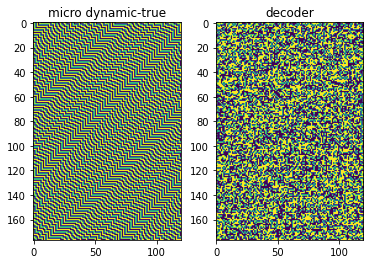

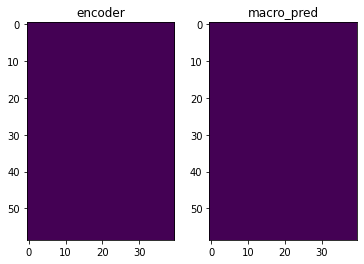

 12%|████████████▋                                                                                           | 1221/10000 [06:19<1:01:22,  2.38it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 1., 1.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 12%|█████████████▏                                                                                            | 1240/10000 [06:25<43:15,  3.38it/s]

epoch: 1240/10000,train loss:11.51462,valid_loss:11.54707241


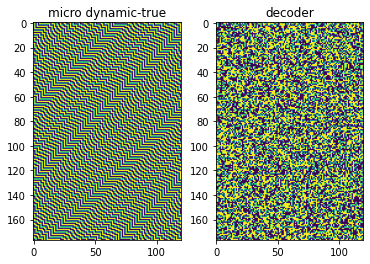

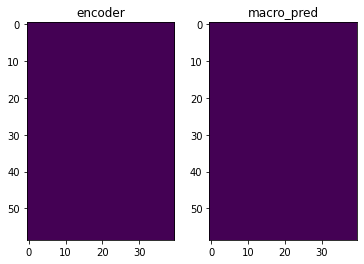

 12%|█████████████▏                                                                                            | 1241/10000 [06:26<55:35,  2.63it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [0., 1., 0.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


 13%|█████████████▎                                                                                            | 1260/10000 [06:32<42:18,  3.44it/s]

epoch: 1260/10000,train loss:11.49310,valid_loss:11.51059341


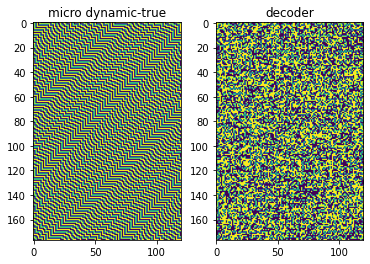

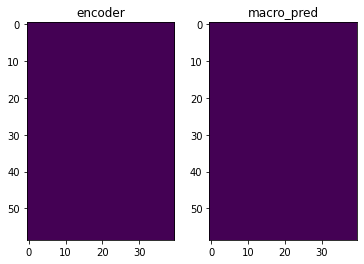

 13%|█████████████▎                                                                                            | 1261/10000 [06:32<54:02,  2.69it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 0.],
        [1., 1., 1.],
        [1., 1., 0.]], grad_fn=<SelectBackward0>)


 13%|█████████████▌                                                                                            | 1280/10000 [06:38<41:44,  3.48it/s]

epoch: 1280/10000,train loss:11.52303,valid_loss:11.50132561


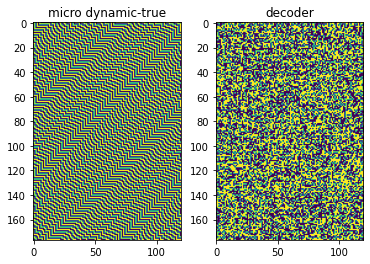

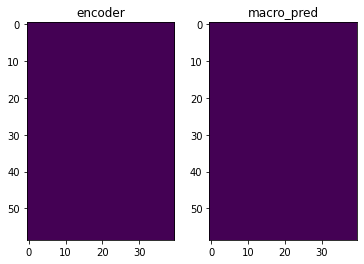

 13%|█████████████▌                                                                                            | 1281/10000 [06:38<53:53,  2.70it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 0., 1.],
        [0., 0., 0.]], grad_fn=<SelectBackward0>)


 13%|█████████████▊                                                                                            | 1300/10000 [06:44<42:17,  3.43it/s]

epoch: 1300/10000,train loss:11.51191,valid_loss:11.50365543


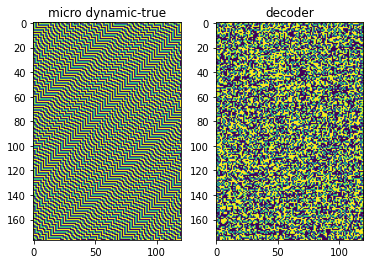

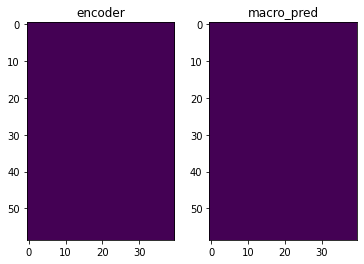

 13%|█████████████▊                                                                                            | 1301/10000 [06:44<54:18,  2.67it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 0., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


 13%|█████████████▉                                                                                            | 1320/10000 [06:50<42:19,  3.42it/s]

epoch: 1320/10000,train loss:11.51985,valid_loss:11.52116394


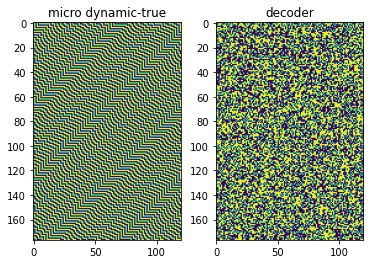

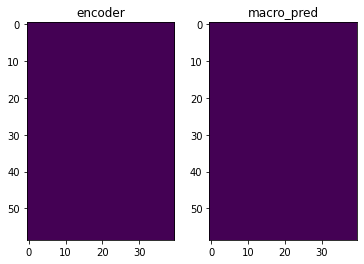

 13%|██████████████                                                                                            | 1321/10000 [06:51<54:46,  2.64it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 0., 1.],
        [0., 1., 1.]], grad_fn=<SelectBackward0>)


 13%|██████████████▏                                                                                           | 1340/10000 [06:56<42:17,  3.41it/s]

epoch: 1340/10000,train loss:11.50006,valid_loss:11.50219154


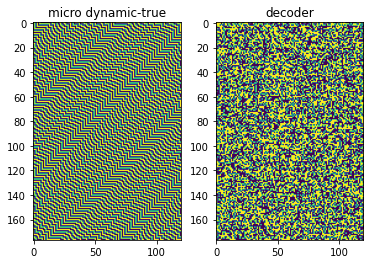

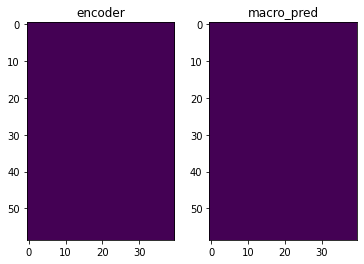

 13%|██████████████▏                                                                                           | 1341/10000 [06:57<54:17,  2.66it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 14%|██████████████▍                                                                                           | 1360/10000 [07:02<41:54,  3.44it/s]

epoch: 1360/10000,train loss:11.51222,valid_loss:11.51135254


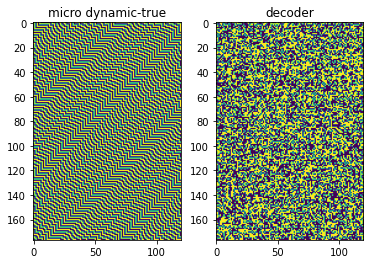

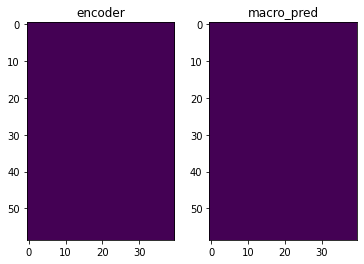

 14%|██████████████▍                                                                                           | 1361/10000 [07:03<53:30,  2.69it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 0.],
        [1., 0., 0.],
        [0., 1., 0.]], grad_fn=<SelectBackward0>)


 14%|██████████████▋                                                                                           | 1380/10000 [07:08<42:16,  3.40it/s]

epoch: 1380/10000,train loss:11.51092,valid_loss:11.52593327


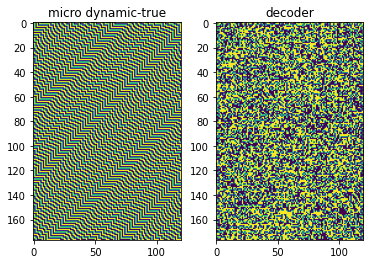

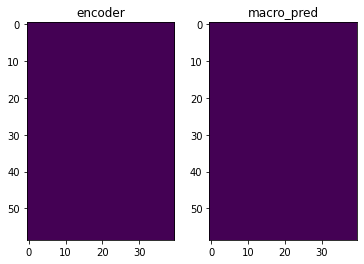

 14%|██████████████▋                                                                                           | 1381/10000 [07:09<54:13,  2.65it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 1., 1.],
        [1., 0., 1.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 14%|██████████████▊                                                                                           | 1400/10000 [07:15<43:25,  3.30it/s]

epoch: 1400/10000,train loss:11.52167,valid_loss:11.52289772


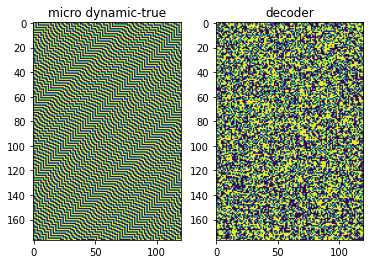

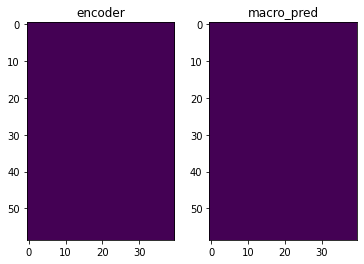

 14%|██████████████▊                                                                                           | 1401/10000 [07:15<55:11,  2.60it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [0., 1., 0.],
        [1., 0., 0.]], grad_fn=<SelectBackward0>)


 14%|███████████████                                                                                           | 1420/10000 [07:21<44:26,  3.22it/s]

epoch: 1420/10000,train loss:11.52685,valid_loss:11.51568890


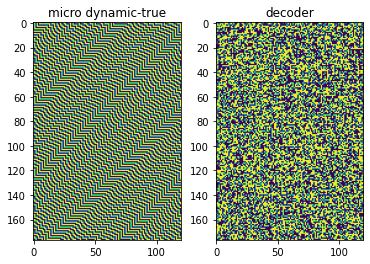

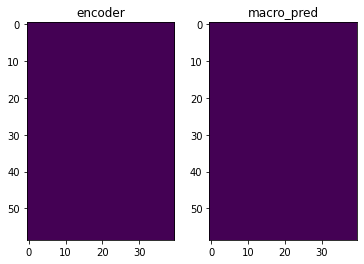

 14%|███████████████                                                                                           | 1421/10000 [07:22<56:35,  2.53it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 0.],
        [0., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 14%|███████████████▎                                                                                          | 1440/10000 [07:27<41:30,  3.44it/s]

epoch: 1440/10000,train loss:11.51206,valid_loss:11.50370979


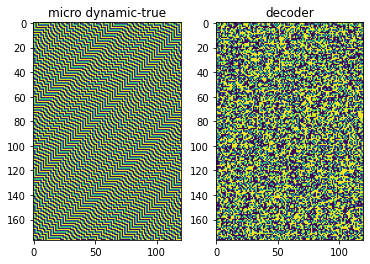

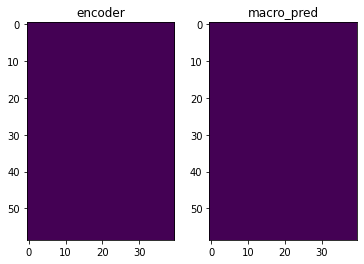

 14%|███████████████▎                                                                                          | 1441/10000 [07:28<53:19,  2.68it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[0., 0., 1.],
        [1., 1., 0.],
        [1., 0., 1.]], grad_fn=<SelectBackward0>)


 15%|███████████████▍                                                                                          | 1460/10000 [07:34<48:47,  2.92it/s]

epoch: 1460/10000,train loss:11.49741,valid_loss:11.53704643


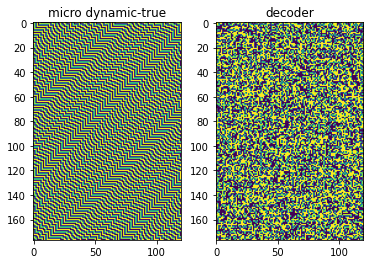

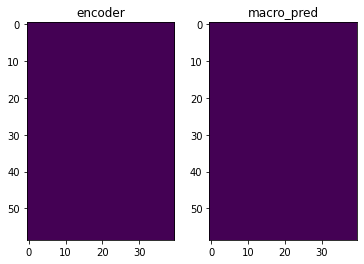

 15%|███████████████▍                                                                                          | 1461/10000 [07:34<59:27,  2.39it/s]

tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SelectBackward0>) tensor([[0.5000, 0.5000],
        [0.5000, 0.5000]], grad_fn=<SliceBackward0>)
tensor([[0., 1., 0.],
        [0., 1., 0.],
        [0., 1., 0.]]) tensor([[1., 1., 1.],
        [1., 1., 0.],
        [1., 1., 1.]], grad_fn=<SelectBackward0>)


 15%|███████████████▋                                                                                          | 1480/10000 [07:40<44:12,  3.21it/s]

epoch: 1480/10000,train loss:11.49292,valid_loss:11.50192070


In [62]:

loss_F2 = torch.nn.KLDivLoss(reduction='batchmean')
loss_F1 = torch.nn.NLLLoss()
loss_F3 = torch.nn.MSELoss()
num_epochs = 10000


torch.manual_seed(seed)
random.seed(seed)

channel = 5
hidden_size = 8
macro_dynamic = DynamicLearner(channel, hidden_size)
macro_dynamic = macro_dynamic.cuda() if use_cuda else macro_dynamic

optimizer1 = optim.Adam(macro_dynamic.parameters(), lr=1e-3, weight_decay=5e-4)

renorm = RenormNet(hidden_size,group_size=group_size)
renorm = renorm.cuda() if use_cuda else renorm
init_weight(renorm)
optimizer2 = optim.Adam(renorm.parameters(), lr=1e-3, weight_decay=5e-4)

train_losses = []
valid_losses = []
last_valid_loss = 10000
count = 0
dynamic.eval()

for epoch in tqdm(range(num_epochs)):#重复训练num_epoch次
    renorm.train()
    t_loss = []
    for train_x, train_y in train_loader:
        if use_cuda:
            train_x = train_x.cuda()
            train_y = train_y.cuda()
        encoder1 = renorm.Encoder(train_x)[:,:,:,1]
        b,t,s = encoder1.shape
        macro_pred = macro_dynamic(encoder1.reshape(-1,s))[:,:,1].reshape(b,t,s)
        decoder2 = renorm.Decoder(macro_pred)
        b,t,s,_ = decoder2.shape
        loss = loss_F1(torch.log(decoder2.view(-1,2)+NEAR_ZERO), train_y.view(-1).long())
        t_loss.append(loss.item())
        optimizer1.zero_grad()
        optimizer2.zero_grad()
        loss.backward()
        optimizer1.step()
        optimizer2.step()
    train_losses.append(np.mean(t_loss))
    if epoch % 20 == 0:
        renorm.eval()
        v_loss = []
        loss1s = []
        loss2s = []
        loss3s = []
        for valid_x, valid_y in valid_loader:
            if use_cuda:
                valid_x = valid_x.cuda()
                valid_y = valid_y.cuda()

            encoder1 = renorm.Encoder(valid_x)

            b,t,s,_ = encoder1.shape
            preds1 = torch.tensor(encoder1.max(3)[1],dtype=torch.float)

            macro_pred = macro_dynamic(preds1.reshape(-1,s))[:,:,1].reshape(b,t,s)
            decoder2 = renorm.Decoder(macro_pred)#b*n*2
            b,t,s,_ = decoder2.shape

            loss = loss_F1(torch.log(decoder2.view(-1,2)+NEAR_ZERO), valid_y.view(-1).long())

            v_loss.append(loss.item())
        valid_losses.append(np.mean(v_loss))
        

    #     if epoch % 5 == 0:
        print(f'epoch: {epoch}/{num_epochs},train loss:{np.mean(t_loss):.5f},valid_loss:{np.mean(v_loss):.8f}')
        if np.mean(v_loss) >= last_valid_loss:
            count += 1
            if count > 30:
                break
        if np.mean(v_loss) < last_valid_loss:
        #             print()
            count = 0
            models = {
                'dynamic':macro_dynamic,
                'renorm':renorm
            }
            torch.save(models, f'./models/unself_{rule}_model_group_size={group_size}_{seed}.pth')
            last_valid_loss = np.mean(v_loss)
        
        plt.figure()
        plt.subplot(122)
        plt.title('decoder')
        plt.imshow(decoder2.cpu().detach().numpy()[0,:,:,1])
        plt.subplot(121)
        plt.title('micro dynamic-true')
        plt.imshow(valid_y[0,:,:].cpu().detach().numpy())
        plt.show()

        plt.figure()
        plt.subplot(121)
        plt.title('encoder')
        plt.imshow(encoder1[0,:,:,1].cpu().detach().numpy())
        plt.subplot(122)
        plt.title('macro_pred')
        plt.imshow(macro_pred[0,:,:].cpu().detach().numpy())
        plt.show()

        print(encoder1[0,:2,:2,1],macro_pred[0,:2,:2])
        print(valid_y[0,:3,:3],decoder2[0,:3,:3,1])
        

In [63]:
group_size,rule,seed

(3, 85, 2053)

In [64]:
#  torch.save(models, f'./models/unself_{rule}_model_group_size={group_size}.pth')

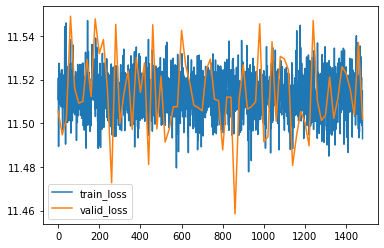

In [65]:
plt.plot(train_losses,label='train_loss')
plt.plot(np.arange(0,len(train_losses),20),valid_losses,label='valid_loss')
plt.legend()
with open(f'./data/loss_unself_{rule}_{seed}.pkl','wb') as f:
    pkl.dump({
        'train':train_losses,
        'valid':valid_losses
    },f)